In [36]:
from ultralytics import YOLO

# Load model
segmentation_model = YOLO("Z:/github/Autotranslate_Manga/MangaAutoTranslator/mltranslator/models/text_segment/best.pt").to("cuda")

In [2]:
from PIL import Image

input_img = Image.open('Z:/github/Autotranslate_Manga/MangaAutoTranslator/dataset/test_inpaint/image_0.jpg')

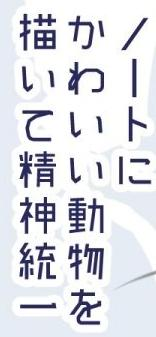

In [3]:
input_img

In [4]:
input_img.size

(156, 337)

In [5]:
results = model(input_img)


0: 640x320 1 text, 57.2ms
Speed: 0.0ms preprocess, 57.2ms inference, 73.8ms postprocess per image at shape (1, 3, 640, 320)


In [22]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

for result in results:
    # get array results
    masks = result.masks.data
    boxes = result.boxes.data
    # extract classes
    clss = boxes[:, 5]
    # get indices of results where class is 0 (people in COCO)
    indices = torch.where(clss == 0)
    # use these indices to extract the relevant masks
    masks = masks[indices]
    # scale for visualizing results
    mask = torch.any(masks, dim=0).int() * 255
    mask_np = mask.cpu().numpy().astype(np.uint8)
    # save to file
    # cv2.imwrite('merged_segs.jpg', mask.cpu().numpy())

In [ ]:
plt.imshow(mask.cpu().numpy())

In [23]:
pil_mask = Image.fromarray(mask_np)

In [27]:
pil_mask

In [30]:
pil_mask.resize((156, 337))

In [38]:
from mltranslator.modules.inpainting.inpaintor import * 
my_inpaintor = Inpaintor()

In [104]:
original_img = Image.open('Z:/github/Autotranslate_Manga/MangaAutoTranslator/dataset/original.jpg')
inpaintor_mask, _ = my_inpaintor.inpaint(original_img)
np_original_img = np.array(original_img)
h, w = original_img.size
final_mask = np.zeros((w, h), dtype=np.uint8)

In [105]:
final_mask.shape

(3123, 2297)

In [45]:
print(inpaintor_mask.max())

255


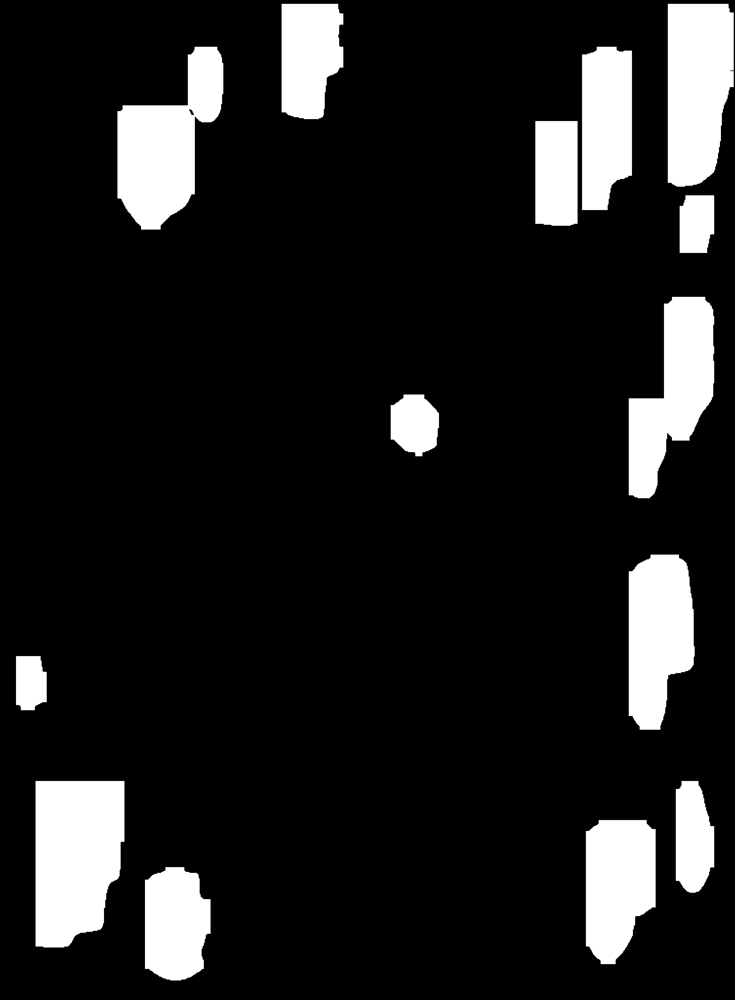

In [63]:
Image.fromarray(inpaintor_mask)

In [106]:
h, w

(2297, 3123)

In [107]:
Image.fromarray(final_mask).size

(2297, 3123)

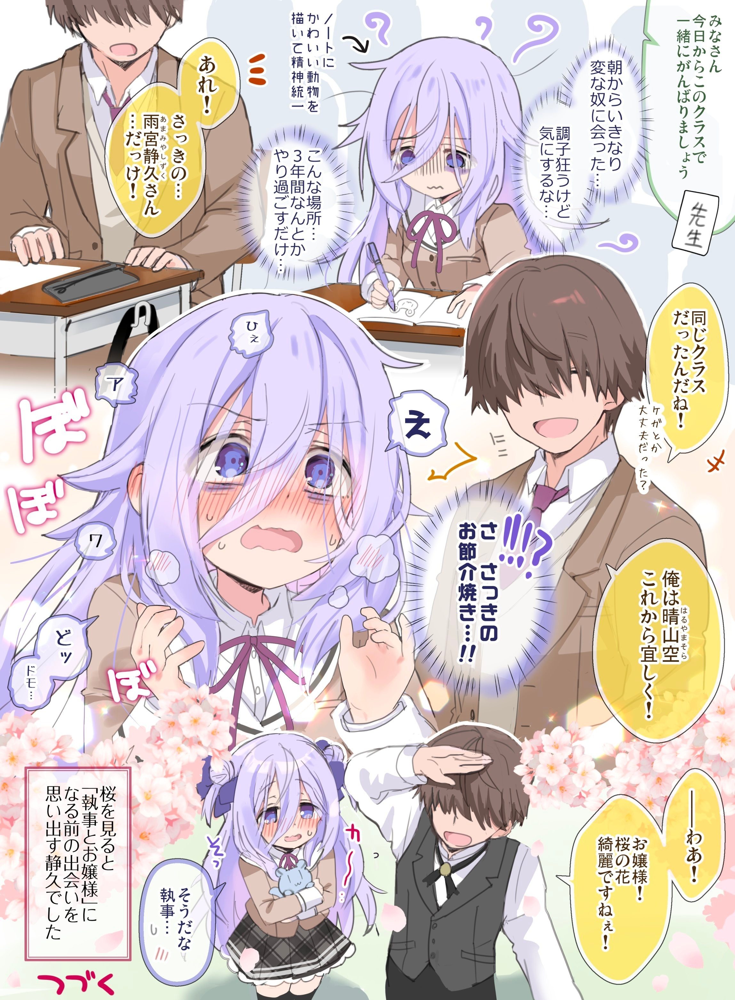

In [108]:
Image.fromarray(np_original_img)

In [115]:
from mltranslator.modules.detection import TextDetector
text_detector = TextDetector()
bboxes = text_detector.get_detect_output_api(original_img)
yolo_img, _ = text_detector.get_detect_output(original_img)

# Image.fromarray(yolo_img).save('Z:/github/Autotranslate_Manga/MangaAutoTranslator/dataset/yolo.jpg')

np_image = np.array(original_img)
# np_mask_image = np.array(mask.cpu())
ocr_padding = 4
ocr_padding_top_bottom = ocr_padding // 2

for idx, box in enumerate(bboxes['list_bboxes']):
    xmin, ymin, xmax, ymax = box
    x1_ocr = max(int(xmin) - ocr_padding, 0)  # Ensuring the value doesn't go below 0
    y1_ocr = max(int(ymin) - ocr_padding_top_bottom, 0)  # Adding padding to the top
    x2_ocr = min(int(xmax) + ocr_padding, w)  # Adjust according to the image width
    y2_ocr = min(int(ymax) + ocr_padding_top_bottom, h)  # Adding padding to the bottom
    # inpaintor_mask[ymin:ymax, xmin:xmax]= 255
    if x1_ocr >= x2_ocr:
        x1_ocr = xmin
        x2_ocr = xmax
    if y1_ocr >= y2_ocr:
        y1_ocr = ymin
        y2_ocr = ymax
    crop_img = np_original_img[y1_ocr:y2_ocr, x1_ocr:x2_ocr]
    # crop_img = np_original_img[ymin:ymax, xmin:xmax]
    # Image.fromarray(crop_img).save(f'Z:/github/Autotranslate_Manga/MangaAutoTranslator/dataset/test_inpaint/{idx}.jpg')
    h_crop, w_crop, _ = crop_img.shape
    # # break
    seg_results = segmentation_model(crop_img)
    for seg_result in seg_results:
        # Get array results
        masks = seg_result.masks.data
        boxes = seg_result.boxes.data
        # Extract classes
        clss = boxes[:, 5]
        # Get indices of results where class is 0 (people in COCO)
        indices = torch.where((clss == 0) | (clss == 1))
        # Use these indices to extract the relevant masks
        masks = masks[indices]
        # Scale for visualizing results
        mask = torch.any(masks, dim=0).int() * 255
        mask_np = mask.cpu().numpy().astype(np.uint8)
        pil_mask = Image.fromarray(mask_np).resize((w_crop, h_crop))
        # final_mask[y1_ocr:y2_ocr, x1_ocr:x2_ocr] = np.array(pil_mask)
        # final_mask[ymin:ymax, xmin:xmax] = np.array(pil_mask)
        try:
    #         final_mask[y1_ocr:y2_ocr, x1_ocr:x2_ocr] = np.array(pil_mask)
            final_mask[y1_ocr:y2_ocr, x1_ocr:x2_ocr] = np.array(pil_mask)
        except:
            print(y1_ocr,y2_ocr, x1_ocr,x2_ocr)
            print(final_mask.shape)
            print(final_mask[y1_ocr:y2_ocr, x1_ocr:x2_ocr].shape)
            print(crop_img.shape)
            print(pil_mask.size)
            print(np.array(pil_mask).transpose().shape)


0: 640x320 1 text, 37.4ms
Speed: 0.0ms preprocess, 37.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 320)

0: 640x224 1 text, 29.9ms
Speed: 1.9ms preprocess, 29.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 224)

0: 640x288 1 sfx, 31.8ms
Speed: 0.0ms preprocess, 31.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 288)

0: 640x192 1 text, 26.0ms
Speed: 1.0ms preprocess, 26.0ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 192)

0: 640x416 1 text, 40.3ms
Speed: 0.0ms preprocess, 40.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 416)

0: 640x288 1 text, 10.7ms
Speed: 1.0ms preprocess, 10.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 288)

0: 640x320 1 text, 13.7ms
Speed: 1.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 320)

0: 640x352 1 text, 1 sfx, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 6.8ms postprocess per image at shape (1, 3, 640, 352)

0

In [116]:
Image.fromarray(final_mask).save('Z:/github/Autotranslate_Manga/MangaAutoTranslator/dataset/ai_mask.jpg')

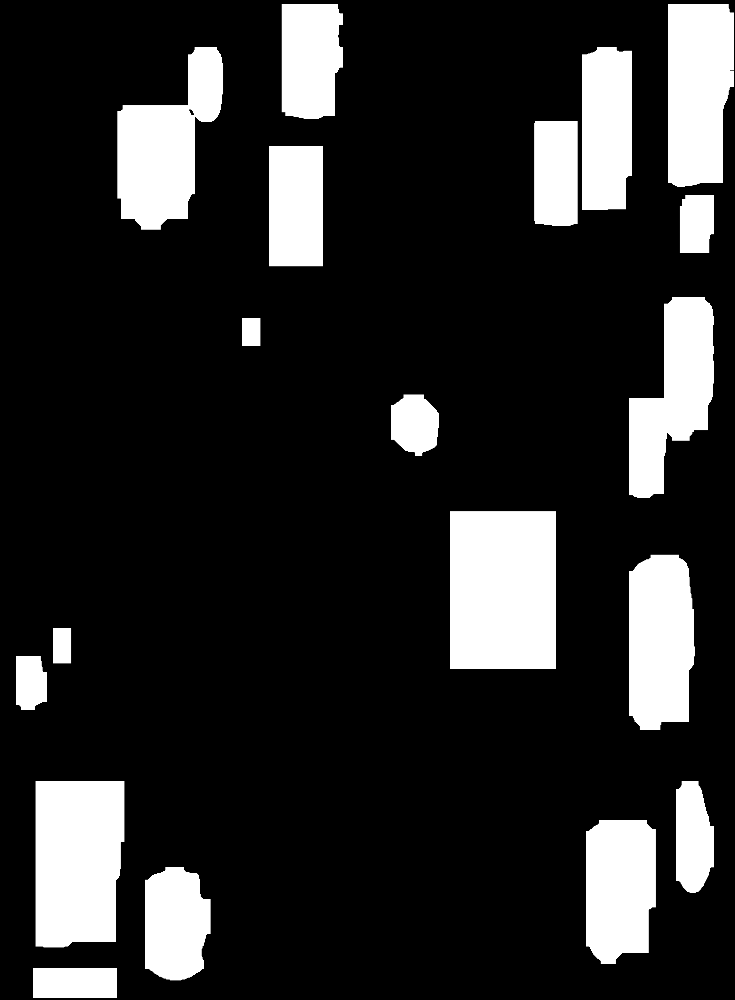

In [53]:
Image.fromarray(inpaintor_mask)